Notebook to explore remote sensing indexes to coorespond with aquatic vs terrestrial carbon measurements

In [1]:
import pandas as pd
import geopandas as gpd
import seaborn as sns
from matplotlib import pyplot as plt
import os
import numpy as np
from shapely.geometry import box

from land_cover.load import loadKurek, plot_dir, loadGreenness, kurek_bounds
from land_cover.distance import calcMeanBoundDist

%load_ext autoreload
%autoreload 2

In [2]:
# Load merged dataset
gdf_kurek = loadKurek()
gdf_kurek.drop(columns=[col for col in gdf_kurek.columns if 'dig' in col], inplace=True)
gdf_kurek.head()

,Sample,Lake_name,Match_name,Date,Latitude,Longitude,Region,Ecoregion,FDOM (RU),C (%),...,Formulae,Mass (Da),H/C,O/C,AImod,COX,N/C (x103),S/C (x103),geometry,lake_area_km2
0,Balloon lake 07-19-19,Balloon lake,Balloon lake,07-19-19,58.87754,-111.22644,PAD,Taiga Shield,36.69,16.7,...,8842.0,510.384995,1.17,0.51,0.26,-0.150,25.82,12.08,"POLYGON ((-858387.532 2190061.356, -858393.238...",0.039814
1,Balloon lake 1 08-05-19,Balloon lake 1,Balloon lake 1,08-05-19,58.87856,-111.25269,PAD,Taiga Shield,18.45,17.6,...,5533.0,504.581835,1.17,0.54,0.25,-0.088,27.87,4.67,"POLYGON ((-860487.428 2191256.438, -860442.449...",0.631678
2,Big Beaver lake 07-20-19,Big Beaver lake,Big Beaver lake,07-20-19,58.76115,-111.08667,PAD,Taiga Shield,15.68,17.4,...,6946.0,504.145076,1.14,0.51,0.28,-0.118,23.13,7.87,"POLYGON ((-853218.958 2175434.365, -853225.947...",0.127003
3,Blanche 07-28-19,Blanche,Blanche lake,07-28-19,58.39219,-111.27903,PAD,Taiga Plain,13.64,18.7,...,8427.0,505.269131,1.07,0.51,0.32,-0.052,18.72,10.43,"POLYGON ((-873549.171 2137394.191, -873534.59 ...",4.186378
4,Chilloney's lake inlet 07-11-19,Chilloney's lake inlet,Chilloney's lake,07-11-19,58.82465,-111.36208,PAD,Taiga Plain,11.97,16.3,...,9515.0,493.524704,1.12,0.52,0.28,-0.087,28.98,12.84,"POLYGON ((-867315.567 2185220.74, -867301.216 ...",0.186970


Add greenness

In [3]:
gdf_green = loadGreenness() #bounds='kurek')
len(gdf_green)

542997

In [5]:
# Crop for faster processing, project to common coordinate system
gdf_green = gpd.sjoin(gdf_green, gpd.GeoDataFrame(geometry=[box(*kurek_bounds)], crs="EPSG:4326"), predicate="intersects").drop(columns="index_right").to_crs(gdf_kurek.crs)
len(gdf_green)

112326

In [ ]:
# Join greenness to kurek geoms, Noting that some lakes will not have any greenness data because they are too small
len_gdf0 = len(gdf_kurek)
print(f"Original length of kurek dataset: {len_gdf0}")
gdf = gpd.sjoin(gdf_kurek[["geometry", "Sample"]], gdf_green, "left")

Original length of kurek dataset: 91


In [28]:
# Some lakes have multiple matches in GLAKES Due to narrow connections being split into multiple lakes. Need to aggregate by averaging.
agg_dict = {
    col: "mean" if pd.api.types.is_dtype_equal(gdf[col].dtype, "float64") else "first"
    for col in gdf.columns
}
gdf = gdf.groupby("Sample", as_index=False).agg(agg_dict)

In [29]:
# Join greenness to remaining kurek fields
len_gdf0 = len(gdf)
gdf = pd.merge(
    gdf, gdf_kurek.drop(columns=["geometry"]), "inner", "Sample", validate="one_to_one"
).set_geometry("geometry")
print(f"After join: length of kurek dataset: {len(gdf)}")

After join: length of kurek dataset: 91


Note that only 45 / 91 have Liu greenness, and only 35 have Kuhn greenness

In [30]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 91 entries, 0 to 90
Data columns (total 74 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   geometry                  91 non-null     geometry
 1   Sample                    91 non-null     object  
 2   index_right               45 non-null     float64 
 3   OBJECTID                  45 non-null     float64 
 4   Lake_id                   45 non-null     float64 
 5   Area_bound                45 non-null     float64 
 6   Area_PW                   45 non-null     float64 
 7   Continent                 45 non-null     object  
 8   Lat                       45 non-null     float64 
 9   Lon                       45 non-null     float64 
 10  GFed_flag                 45 non-null     float64 
 11  PFed_flag                 45 non-null     float64 
 12  Endo_flag                 45 non-null     float64 
 13  Rser_flag                 45 non-null     fl

In [31]:
gdf.head()
assert len(gdf) == len_gdf0

# Data explore

In [11]:
sns.pairplot(gdf)

## Add metrics

In [32]:
gdf = calcMeanBoundDist(gdf, True)

In [50]:
# Figure out col names and indeces
pd.DataFrame(gdf.columns)
print([(i, name) for i, name in enumerate(gdf.columns.values)])

[(0, 'geometry'), (1, 'Sample'), (2, 'index_right'), (3, 'OBJECTID'), (4, 'Lake_id'), (5, 'Area_bound'), (6, 'Area_PW'), (7, 'Continent'), (8, 'Lat'), (9, 'Lon'), (10, 'GFed_flag'), (11, 'PFed_flag'), (12, 'Endo_flag'), (13, 'Rser_flag'), (14, 'Shape_Leng'), (15, 'Shape_Area'), (16, 'MA_p1'), (17, 'MA_p2'), (18, 'MA_p3'), (19, 'LEV_p3'), (20, 'LEV_p1'), (21, 'LEV_p1p3in'), (22, 'Hylak_id'), (23, 'green_sen_slope'), (24, 'green_mann_kendall_trend'), (25, 'green_trend_significance'), (26, 'green_b2_mean'), (27, 'green_b2_stddev'), (28, 'Lake_name'), (29, 'Match_name'), (30, 'Date'), (31, 'Latitude '), (32, 'Longitude'), (33, 'Region'), (34, 'Ecoregion'), (35, 'FDOM (RU)'), (36, 'C (%)'), (37, 'A (%)'), (38, 'T (%)'), (39, 'B (%)'), (40, 'M (%)'), (41, 'FI'), (42, 'a350 (naperian)'), (43, 'a250:a365'), (44, 'S275-295 (nm-1)'), (45, 'S350-400 (nm-1)'), (46, 'SR'), (47, 'DOC (mg L-1)'), (48, 'SUVA254'), (49, 'SpC (μS cm-1)'), (50, 'Chl-a  (μg L-1)'), (51, 'pH'), (52, 'δD (‰)'), (53, 'δ18O (

In [52]:
# Sort covariates by analysis type
optical_names = [col for col in gdf.columns[35:56] if pd.api.types.is_float_dtype(gdf[col])]
icrms_names = [col for col in gdf.columns[57:-3] if pd.api.types.is_float_dtype(gdf[col])]
physical_names = [col for col in gdf.columns[-3:] if pd.api.types.is_float_dtype(gdf[col])]
physical_names = physical_names + ['Latitdue', 'Longitude']
greenness_names = [col for col in gdf.columns[19:22] if pd.api.types.is_float_dtype(gdf[col])] + [
    "green_sen_slope",
    "green_b2_mean",
]

print(optical_names, "\n", icrms_names, "\n", physical_names, "\n", greenness_names)

['FDOM (RU)', 'C (%)', 'A (%)', 'T (%)', 'B (%)', 'M (%)', 'FI', 'a350 (naperian)', 'a250:a365', 'S275-295 (nm-1)', 'S350-400 (nm-1)', 'SR', 'DOC (mg L-1)', 'SUVA254', 'SpC (μS cm-1)', 'Chl-a  (μg L-1)', 'pH', 'δD (‰)', 'δ18O (‰)', 'Δ18O (‰)', 'DO (% sat.)'] 
 ['CHON (%)', 'CHOS (%)', 'CHONS (%)', 'Condensed Aromatics (%)', 'Polyphenolics (%)', 'HUPLow O (%)', 'HUPHigh O (%)', 'Aliphatics (%)', 'Formulae', 'Mass (Da)', 'H/C', 'O/C', 'AImod', 'COX', 'N/C (x103)', 'S/C (x103)'] 
 ['lake_area_km2', 'mean_bound_dist', 'max_bound_dist', 'Latitdue', 'Longitude'] 
 ['LEV_p3', 'LEV_p1', 'LEV_p1p3in', 'green_sen_slope', 'green_b2_mean']


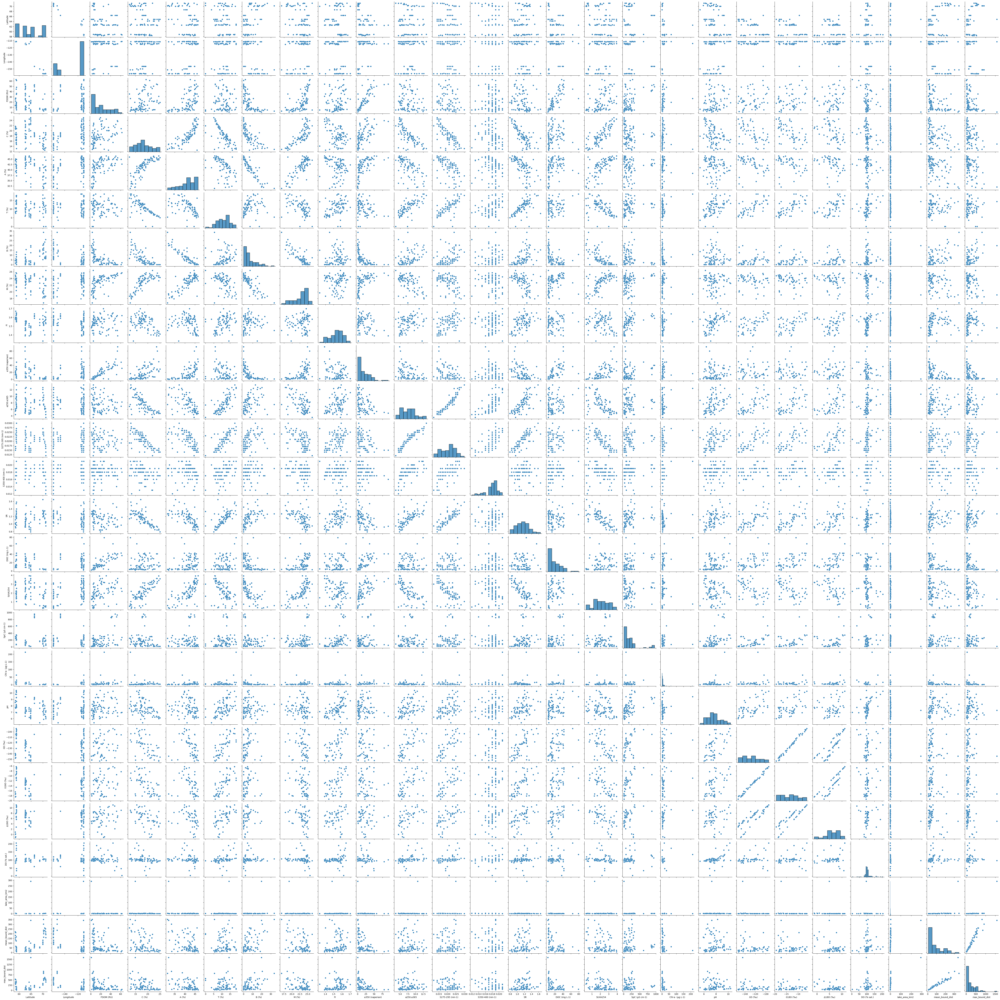

In [ ]:
sns.pairplot(gdf[optical_names + physical_names])

Plot By comparing one type of analysis to another

In [ ]:
# Figure out good xscale for plotting
# One outlier each for area and max boundary distance
gdf.lake_area_km2.sort_values()
gdf.max_bound_dist.sort_values()

19      14.227825
57      26.310784
45      26.707341
24      29.649964
33      36.480429
         ...     
84     626.917803
71     819.726499
72     853.527034
70     921.634089
49    1583.298039
Name: max_bound_dist, Length: 91, dtype: float64

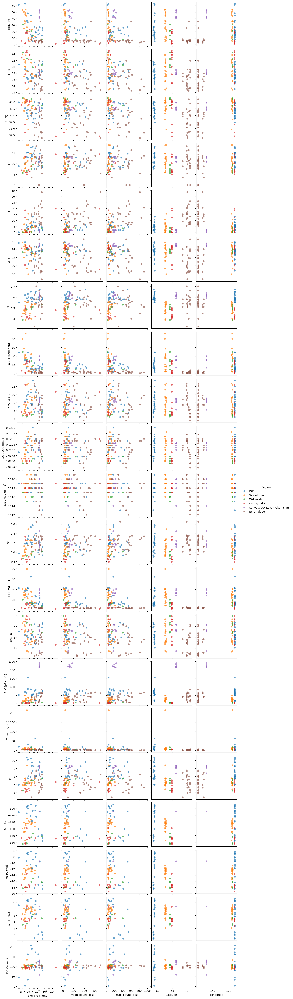

In [116]:
g = sns.pairplot(
    gdf,
    y_vars=optical_names,
    x_vars=physical_names,
    plot_kws={"alpha": 0.7, "edgecolor": "none"},
    hue="Region",
)
# g.axes[-1, 0].set_xlim([0, 5.1])
g.axes[-1, 0].set_xscale("log")
g.axes[-1, 2].set_xlim([0, 1000])

plt.savefig(os.path.join(plot_dir, "pairplot_opt_morph.png"), dpi=400)

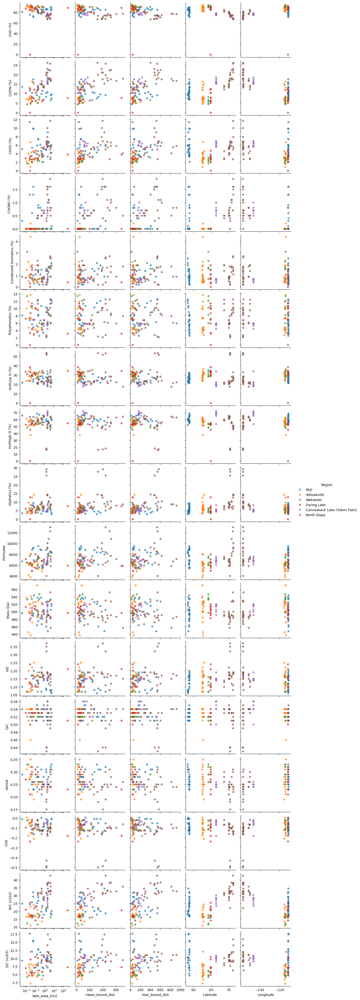

In [115]:
g = sns.pairplot(
    gdf,
    y_vars=icrms_names,
    x_vars=physical_names,
    plot_kws={"alpha": 0.7, "edgecolor": "none"},
    hue="Region",
)

# g.axes[-1, 0].set_xlim([0, 5.1])
g.axes[-1, 0].set_xscale("log")
g.axes[-1, 2].set_xlim([0, 1000])
plt.savefig(os.path.join(plot_dir, "pairplot_icrms_morph.png"), dpi=400)

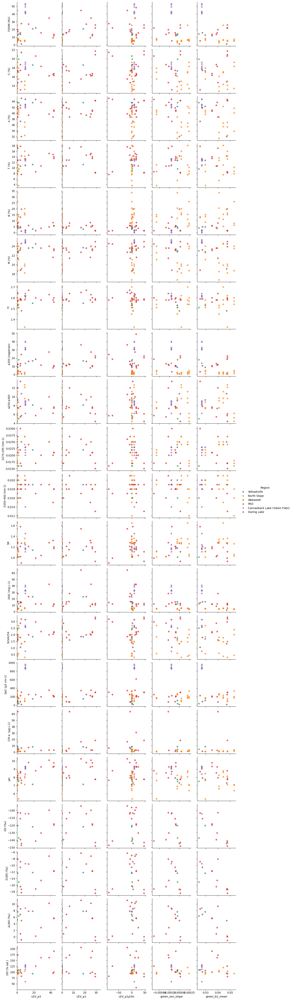

In [ ]:
g = sns.pairplot(
    gdf,
    y_vars=optical_names,
    x_vars=greenness_names,
    plot_kws={"alpha": 0.7, "edgecolor": "none"},
    hue="Region",
)

g.axes[-1, 0].set_xlim([0, 46]) # one outlier
g.axes[-1, 1].set_xlim([0, 34]) # three outliers
plt.savefig(os.path.join(plot_dir, "pairplot_greenness_opt.png"), dpi=400)

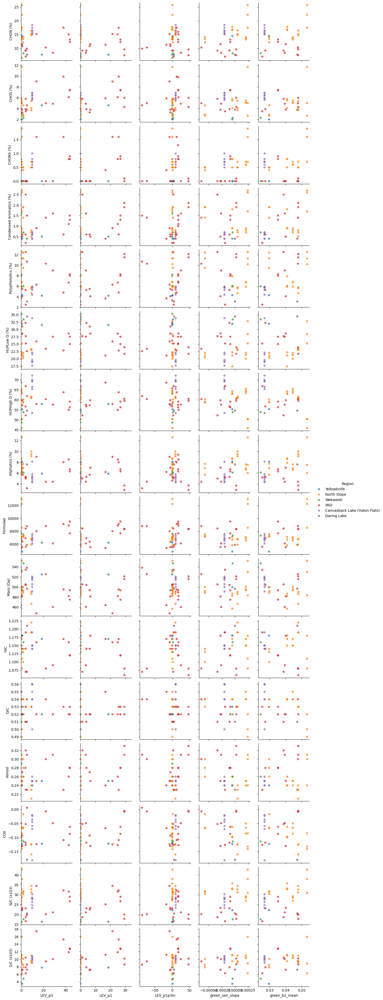

In [60]:
g = sns.pairplot(
    gdf,
    y_vars=icrms_names,
    x_vars=greenness_names,
    plot_kws={"alpha": 0.7, "edgecolor": "none"},
    hue="Region",
)

g.axes[-1, 0].set_xlim([0, 46]) # one outlier
g.axes[-1, 1].set_xlim([0, 34]) # three outliers
plt.savefig(os.path.join(plot_dir, "pairplot_greenness_icrms.png"), dpi=300)

In [ ]:
sns.pairplot(gdf)